# TRABALHANDO COM ARQUIVOS(ENTRADA E SAIDA) PARTE I

## DATAFRAMES E ARQUIVOS CSV 

Uma forma prática de trabalhar com dados tabelados é salva-los em arquivos no formato "CSV" - *Comma-separated values*. Os arquivos "CSV" são arquivos de texto simples que armazenam dados tabelados separados por um delimitador (geralmente a vírgula). Por serem bastante simples, arquivos "CSV" são comuns em todas as plataformas de computadores a abertos em qualquer editor de textos. Forma geral de um arquivo "CSV":
```julia
   nome_coluna_1 , nome_coluna_2
   dado_1_col_1  , dado_1_col_2
   dado_2_col_1  , dado_2_col_2
```
Para criar arquivos "CSV" podemos utilizar uma planilha eletrônica (excel, calc-libreoffice/openoffice). Basta preencher os dados nas celulas e depois salvar com extensão "CSV". 

Um `data frame` é uma estrutura semelhante à uma matriz no qual os dados são tabelados em colunas nomeadas no qual possuem a mesma quantidade de linhas. JOSHI (2016) define data frame como:
> É uma estrutura de dados que tem colunas rotuladas, que individualmente podem ter diferentes tipos de dados. Como uma tabela SQL ou uma planilha, ela tem duas dimensões. Também pode ser pensado como uma lista de dicionários, mas, fundamentalmente, é diferente. 

`Data frame` é a melhor forma de organizar informações pois além de manter uma boa formatação dos dados, ainda permite que seja gravado em arquivos do tipo "CSV", que podem ser abertos e manipulados em softwares de planilha tipo excel ou calc. Exemplo de `Data Frame`:
<img src="Figuras/dataframe.png" align="center" width="300">

### CRIAÇÃO DE ARQUIVOS CSV

#### Criação de um arquivo CSV pelo editor de texto do Jupyter

Na pagina principal do `Jupyter`, selecione "New -> Text File" conforme figura abaixo:

<img src="Figuras/novo_arq_txt.png" align="center" width="700">

Digite os dados conforme figura abaixo:
<img src="Figuras/arquivo_csv.png" align="center" width="400">

`Julia` salva o arquivo no formato `TXT` então basta clicar no título e alterar o nome para `teste.csv`. Para importar os dados use a sintaxe:
```julia
var_dados = CSV.read("nome_arquivo.csv")
```
A função `CSV.read()` coloca os dados em uma estrutura do tipo `DataFrames`. Caso o arquivo `CSV` tenha um cabeçalho contendo o nome das colunas, ocorrerá erro quando for manipulá-lo, pois o cabeçalho é do tipo `String` e portanto deve ser removido ou ignorado. Para ignorar o cabeçalho presente na primeira linha da tabela utilize:
```julia
var_dados = CSV.read("nome_arquivo.csv", header=false)
```

In [61]:
using CSV, DataFrames

In [62]:
tabela_dados = CSV.read("teste.csv", header=false)

,Column1,Column2
1,0,0.0
2,1,1.5
3,2,1.7
4,3,1.8
5,4,1.0
6,5,1.6
7,6,1.8


In [63]:
typeof(tabela_dados)

DataFrame

#### RENOMEAR COLUNAS


Observe que ao importar os dados do arquivo `teste.csv` surge uma linha inicial contendo os nomes das colunas dado como "Column1" e "Column1". Para alterar o nome das colune use:
```julia
rename(dataframe, :nome_coluna_antigo => :nome_coluna_novo)
```
Ou para renomear e substituir o dataframe:

```julia
rename!(dataframe, :nome_coluna_antigo => :nome_coluna_novo)
```
```julia
names!(dataframe, [:novo_nome_coluna_1, :novo_nome_coluna_2]) # todas as colunas
```
Exemplo: Alterar o nome da coluna 1 "Column1" para "x" e "Column2" para "y" .

Para visualizar o cabeçalho das colunas use:

In [65]:
names(tabela_dados) 

2-element Array{Symbol,1}:
 :Column1
 :Column2

In [66]:
rename!(tabela_dados, :Column1 => :x_dados, :Column2 => :y_dados)

,x_dados,y_dados
1,0,0.0
2,1,1.5
3,2,1.7
4,3,1.8
5,4,1.0
6,5,1.6
7,6,1.8


#### VISUALIZAÇÃO DE DADOS

```julia
DataFrame[:nome_coluna_x]              # Todos os elementos da coluna_x
DataFrame[ordem_coluna_x]              # Todos os elementos da coluna_x
DataFrame.nome_coluna_x                # Todos os elementos da coluna_x

DataFrame[:nome_coluna_x][elemento_x]  # Somente um elemento da coluna_x e linha_x
DataFrame[ordem_coluna_x][elemento_x]  # Somente um elemento da coluna_x e linha_x
DataFrame.nome_coluna_x[elemento_x]    # Somente um elemento da coluna_x e linha_x
```

In [67]:
#listar todos os elementos da coluna x_dados
tabela_dados[:x_dados]

7-element Array{Union{Missing, Int64},1}:
 0
 1
 2
 3
 4
 5
 6

In [22]:
#listar todos os elementos da coluna x_dados
tabela_dados[1]

7-element Array{Union{Missing, Int64},1}:
 0
 1
 2
 3
 4
 5
 6

In [23]:
#listar todos os elementos da coluna x_dados
tabela_dados.x_dados

7-element Array{Union{Missing, Int64},1}:
 0
 1
 2
 3
 4
 5
 6

In [27]:
# listar o elemento da terceira linha e segunda coluna
tabela_dados[:y_dados][3]

1.7

In [28]:
# listar o elemento da terceira linha e segunda coluna
tabela_dados[3, 2]

1.7

In [29]:
# listar o elemento da terceira linha e segunda coluna
tabela_dados.y_dados[3]

1.7

In [31]:
# listar todos os elementos da 3ª a 5ª linha
tabela_dados[3:5, :]

,x_dados,y_dados
1,2,1.7
2,3,1.8
3,4,1.0


In [32]:
# multiplicar todos os elementos da segunda linha por 100
tabela_dados.y_dados*100

7-element Array{Float64,1}:
   0.0
 150.0
 170.0
 180.0
 100.0
 160.0
 180.0

**Gráfico**

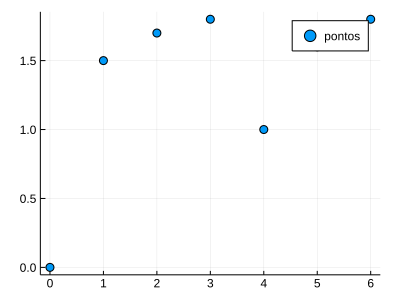

In [68]:
using Plots
gr()

scatter(tabela_dados.x_dados, tabela_dados.y_dados, label = "pontos", size = (400, 300))

### CRIAR DATAFRAMES 

Para criar um dataframe use a sintaxe:
```julia
Nome_dataFrame(nome_coluna_1 = [dado1_col_1, dado2_col_1], nome_coluna_2 = [dado1_col_2, dado2_col_2])

ou
nome_dataframe = DataFrame()
nome_dataframe[:nome_coluna_1] = [dado1_col_1, dado2_col_1]
nome_dataframe[:nome_coluna_2] = [dado1_col_2, dado2_col_2]

```
Uma outra forma é criar um DataFrame no formato CSV:
```julia
dados_string = "Coluna_1 , Coluna_2
                dados_1  , dados_1
                dados_2  , dados_2 "
                  
nome_dataframe = CSV.read(IOBuffer(dados_string))
```

In [34]:
using DataFrames

In [55]:
# criar o dataframe.
# Nomes das colunas não podem ter espaço

dados = DataFrame(Nome_do_software = ["scilab","julia"], Ano = [2005, 2012])

,Nome_do_software,Ano
1,scilab,2005
2,julia,2012


Ou assim:

In [57]:
# Nomes das colunas não podem ter espaço

dados2 = DataFrame()

dados2[:Nome_do_sofware] = ["scilab", "julia"]
dados2[:Ano]             = [2005, 2012]

dados2

,Nome_do_sofware,Ano
1,scilab,2005
2,julia,2012


In [58]:
dados = "Coluna_1 , Coluna_2
         dados_1  , dados_1
         dados_2  , dados_2"
                  
dados3 = CSV.read(IOBuffer(dados))

,Coluna_1,Coluna_2
1,dados_1,dados_1
2,dados_2,dados_2


Outro exemplo

In [36]:
# Nomes das colunas não podem ter espaço

Softwares = DataFrame()

Softwares[:Nome_do_software]  = ["Julia", "SageMath", "Maxima", "Octave","Maxima"]
Softwares[:Ano_de_lancamento] = [2012, 2005, 1980, 2000, 1980]
Softwares[:Site]              = ["julialang.org","sagemath.org","maxima.org","gnu.org/octave", "maxima.org"]

Softwares

,Nome_do_software,Ano_de_lancamento,Site
1,Julia,2012,julialang.org
2,SageMath,2005,sagemath.org
3,Maxima,1980,maxima.org
4,Octave,2000,gnu.org/octave
5,Maxima,1980,maxima.org


In [100]:
# Visualizar cabeçalho das colunas
names(Softwares) 

3-element Array{Symbol,1}:
 :Nome_do_software 
 :Ano_de_lancamento
 :Site             

In [156]:
# saber os tipos dos elementos do dataframe. Aqui temos String (primeira coluna) e tipo Inteiro (segunda coluna)
eltypes(Softwares)

3-element Array{Type,1}:
 String
 Int64 
 String

In [61]:
matriz_dados = rand(3, 3)

3×3 Array{Float64,2}:
 0.247896  0.610616  0.193963
 0.627371  0.652206  0.136758
 0.697997  0.48804   0.810978

In [62]:
DataFrame(matriz_dados)

,x1,x2,x3
1,0.247896,0.610616,0.193963
2,0.627371,0.652206,0.136758
3,0.697997,0.48804,0.810978


#### GRAVAÇÃO E LEITURA DE DATA FRAMES GRAVADOS EM DISCO

**Gravar em disco**

In [157]:
using CSV

In [158]:
CSV.write("dataframe.csv", dados);

In [159]:
CSV.write("Softwares.csv", Softwares);

**Ler data frame gravado em disco**

In [160]:
CSV.read("dataframe.csv")

,Nome_do_sofware,Ano
1,scilab,2005
2,julia,2012


In [161]:
CSV.read("Softwares.csv")

,Nome_do_software,Ano_de_lancamento,Site
1,Julia,2012,julialang.org
2,SageMath,2005,sagemath.org
3,Maxima,1980,maxima.org
4,Octave,2000,gnu.org/octave
5,Maxima,1980,maxima.org


#### MANIPULAR COLUNAS, LINHAS E CONCATENAR DATAFRAMES

In [162]:
using CSV, DataFrames

** Para adicionar uma nova coluna de dados ao DataFrame use:**
```julia
DataFrame[:nova_coluna] = [vetor_dados]
```

In [20]:
# Copia dataframe "dados" gravado em arquivo
dados1 = CSV.read("dataframe.csv")

,Nome_do_sofware,Ano
1,scilab,2005
2,julia,2012


In [21]:
# Adicionar uma nova coluna de dados
dados1[:Gostei] = ["Sim", "Sim"]

2-element Array{String,1}:
 "Sim"
 "Sim"

In [22]:
dados1

,Nome_do_sofware,Ano,Gostei
1,scilab,2005,Sim
2,julia,2012,Sim


** Para deletar uma coluna use:**
```julia
delete!(Dataframe, :nome_coluna)
```

In [23]:
delete!(dados1, :Gostei)

,Nome_do_sofware,Ano
1,scilab,2005
2,julia,2012


** Para alterar nome de uma coluna use:**
```julia
rename(dataframe, :nome_coluna_antigo => :nome_coluna_novo)
```
Ou para renomear e substituir o dataframe:

```julia
rename!(dataframe, :nome_coluna_antigo => :nome_coluna_novo)
```
```julia
names!(dataframe, [:novo_nome_coluna_1, :novo_nome_coluna_2]) # todas as colunas
```

In [1]:
using DataFrames, CSV

In [3]:
names!(dados2, [:novo_nome_coluna_1, :novo_nome_coluna_2]) 

,novo_nome_coluna_1,novo_nome_coluna_2
1,scilab,2005
2,julia,2012


In [2]:
# Copia dataframe "dados" gravado em arquivo
dados2 = CSV.read("dataframe.csv")

,Nome_do_sofware,Ano
1,scilab,2005
2,julia,2012


In [25]:
# Alterar o nome da coluna 1 "Nome_do_sofware" para "Nome_do_programa"
rename(dados2, :Nome_do_sofware=>:Nome_programa)

,Nome_programa,Ano
1,scilab,2005
2,julia,2012


** Para concatenar Dataframes na horizontal use:**
```julia
[Dataframe_1  Dataframe_2] 

hcat(Dataframe_1 , Dataframe_2)
```

In [52]:
# Copia dataframe "dados" gravado em arquivo
dados3 = CSV.read("dataframe.csv")

,Nome_do_sofware,Ano
1,scilab,2005
2,julia,2012


In [53]:
# Novo Dataframe 

dados_novos = DataFrame()

dados_novos[:Nome_do_sofware] = ["scilab","axiom"]
dados_novos[:Ano]             = [2005,1980]

dados_novos

,Nome_do_sofware,Ano
1,scilab,2005
2,axiom,1980


In [54]:
dados5 =  hcat(dados3 , dados_novos)

┌ Warning: Duplicate variable names are deprecated: pass makeunique=true to add a suffix automatically.
│   caller = ip:0x0
└ @ Core :-1


,Nome_do_sofware,Ano,Nome_do_sofware_1,Ano_1
1,scilab,2005,scilab,2005
2,julia,2012,axiom,1980


In [56]:
dados5 =  hcat(dados3 , dados_novos, makeunique=true)

,Nome_do_sofware,Ano,Nome_do_sofware_1,Ano_1
1,scilab,2005,scilab,2005
2,julia,2012,axiom,1980


In [57]:
[dados3  dados_novos]

,Nome_do_sofware,Ano,Nome_do_sofware_1,Ano_1
1,scilab,2005,scilab,2005
2,julia,2012,axiom,1980


** Para concatenar Dataframes na vertical use:**
```julia
[Dataframe_1 ; Dataframe_2] 

vcat(Dataframe_1 , Dataframe_2)
```

In [58]:
dados4 =  vcat(dados3 , dados_novos)

,Nome_do_sofware,Ano
1,scilab,2005
2,julia,2012
3,scilab,2005
4,axiom,1980


In [59]:
[dados3;  dados_novos]

,Nome_do_sofware,Ano
1,scilab,2005
2,julia,2012
3,scilab,2005
4,axiom,1980


Se os Dataframes tiverem uma coluna com nome em comum e mesmo tamanho pode ser usado a forma:
```julia
join(Dataframe_1, Dataframe_2, on = :nome_coluna_comum)
```

** Para deletar linhas e linhas com dados repetidos use:**

Apaga as linhas e sobrescreve o Dataframe (CUIDADO!):
```julia
deleterows!(DataFrame, [linha_1, linha_2,...]) 
deleterows!(DataFrame, linha_1:linha_x)      
```
Sendo `x` um número inteiro que representa a linha.

Apaga somente a linha repetida:
```julia
unique(DataFrame)  
unique!(DataFrame)
```

In [69]:
dados4

,Nome_do_sofware,Ano
1,scilab,2005
2,julia,2012
3,scilab,2005
4,axiom,1980


In [70]:
# deletar uma linha
deleterows!(dados4, 2)

,Nome_do_sofware,Ano
1,scilab,2005
2,scilab,2005
3,axiom,1980


In [71]:
# deletar linhas de dados repetido
unique!(dados4)

,Nome_do_sofware,Ano
1,scilab,2005
2,axiom,1980


** Para ordenar os elementos de um Dataframe**


In [72]:
# Copia dataframe "dados" gravado em arquivo
dados6 = CSV.read("dataframe.csv")

,Nome_do_sofware,Ano
1,scilab,2005
2,julia,2012


In [73]:
# ordena e atualiza
sort!(dados6, :Nome_do_sofware)

,Nome_do_sofware,Ano
1,julia,2012
2,scilab,2005


#### VISUALIZAR E ALTERAR DADOS EM UM DATAFRAME

In [74]:
using DataFrames

In [75]:
# copiar Dataframe gravado em arquivo
Softwares1 = CSV.read("Softwares.csv")

,Nome_do_software,Ano_de_lancamento,Site
1,Julia,2012,julialang.org
2,SageMath,2005,sagemath.org
3,Maxima,1980,maxima.org
4,Octave,2000,gnu.org/octave
5,Maxima,1980,maxima.org


**Visualizar dados**

```julia
DataFrame[:nome_coluna_x]              # Todos os elementos da coluna_x
DataFrame[coluna_x]                    # Todos os elementos da coluna_x
DataFrame.nome_coluna_x                # Todos os elementos da coluna_x

DataFrame[:nome_coluna_x][elemento_x]  # Somente um elemento da coluna_x e linha_x
DataFrame[coluna_x][elemento_x]        # Somente um elemento da coluna_x e linha_x
DataFrame.nome_coluna_x[elemento_x]    # Somente um elemento da coluna_x e linha_x
```

In [184]:
# Visualizando todos os elementos da primeira coluna pelo nome
Softwares1[:Nome_do_software]

5-element Array{Union{Missing, String},1}:
 "Julia"   
 "SageMath"
 "Maxima"  
 "Octave"  
 "Maxima"  

In [185]:
# Visualizando todos os elementos da primeira coluna pela ordem
Softwares1[1]

5-element Array{Union{Missing, String},1}:
 "Julia"   
 "SageMath"
 "Maxima"  
 "Octave"  
 "Maxima"  

In [200]:
# Visualizando todos os elementos da terceira coluna
Softwares1.Site

5-element Array{Union{Missing, String},1}:
 "julialang.org" 
 "sagemath.org"  
 "maxima.org"    
 "gnu.org/octave"
 "maxima.org"    

In [201]:
# acessando o terceiro elemento da primeira coluna
Softwares1[:Nome_do_software][3]

"Maxima"

In [76]:
# acessando o terceiro elemento da primeira coluna
Softwares1[1][3]

"Maxima"

In [203]:
Softwares1.Site[3]

"maxima.org"

**Alterar dados em um dataframe**

```julia
DataFrame[:nome_coluna_x][elemento_x] = novo_dado           # altera o dado da coluna_x e linha_x
DataFrame[coluna_x][elemento_x]       = novo_dado           # altera o dado da coluna_x e linha_x
DataFrame[[elem_x1,elem_x2,elem_x3],:coluna_x] = novo_dado* # altera os dados dos elem x1,x2,x3 da coluna_x

*novo_dado pode ser um vetor correspondente aos novos dados de elem x1,x2,x3...
```

In [204]:
# alterando o valor do terceiro elemrnto da primeira coluna
Softwares1[1][3] = "maXIma"

"maXIma"

In [78]:
# veja o novo nome do software maxima
Softwares1

,Nome_do_software,Ano_de_lancamento,Site
1,Julia,2012,julialang.org
2,SageMath,2005,sagemath.org
3,maXIma,1980,maxima.org
4,Octave,2000,gnu.org/octave
5,Maxima,1980,maxima.org


**Adicionar linha de dados**

```julia
push!(Dataframe, [dado_col_x1,dado_col_x2])
ou
nome_Dataframe = vcat(nome_Dataframe, DataFrame(dado_col_x1 = valor,dado_col_x2 = valor))
```
Sendo x um número inteiro que representa a coluna ou elemento.


In [79]:
push!(Softwares1, ["FreeMat",2001,"freemat.org"])

,Nome_do_software,Ano_de_lancamento,Site
1,Julia,2012,julialang.org
2,SageMath,2005,sagemath.org
3,maXIma,1980,maxima.org
4,Octave,2000,gnu.org/octave
5,Maxima,1980,maxima.org
6,FreeMat,2001,freemat.org


In [80]:
Softwares1

,Nome_do_software,Ano_de_lancamento,Site
1,Julia,2012,julialang.org
2,SageMath,2005,sagemath.org
3,maXIma,1980,maxima.org
4,Octave,2000,gnu.org/octave
5,Maxima,1980,maxima.org
6,FreeMat,2001,freemat.org


In [81]:
# outra forma de adicionar uma linha de dados. Ficará 2 "FreeMat"
Softwares1 = vcat(Softwares1, DataFrame(Nome_do_software="FreeMat", Ano_de_lancamento = 2001, Site="freemat.org"))

,Nome_do_software,Ano_de_lancamento,Site
1,Julia,2012,julialang.org
2,SageMath,2005,sagemath.org
3,maXIma,1980,maxima.org
4,Octave,2000,gnu.org/octave
5,Maxima,1980,maxima.org
6,FreeMat,2001,freemat.org
7,FreeMat,2001,freemat.org


**Ordenando dados**
```julia
sort(Dataframe, cols = order(:nome_coluna))
sort!(Dataframe, cols = order(:nome_coluna)) # ordena e modifica o Dataframe(CUIDADO!)
```
Use somente **sort** sem o "! " para evitar a atualização do vetor

In [186]:
sort!(Softwares1, order(:Ano_de_lancamento))

,Nome_do_software,Ano_de_lancamento,Site
1,Maxima,1980,maxima.org
2,Maxima,1980,maxima.org
3,Octave,2000,gnu.org/octave
4,SageMath,2005,sagemath.org
5,Julia,2012,julialang.org


In [187]:
# veja que o dataframe Softwares foi atualizado automaticamente
Softwares1

,Nome_do_software,Ano_de_lancamento,Site
1,Maxima,1980,maxima.org
2,Maxima,1980,maxima.org
3,Octave,2000,gnu.org/octave
4,SageMath,2005,sagemath.org
5,Julia,2012,julialang.org


**Retirar elementos repetidos**

Use somente **unique(dataframe)** sem o "! " para evitar a atualização do vetor

In [188]:
unique!(Softwares1)

,Nome_do_software,Ano_de_lancamento,Site
1,Maxima,1980,maxima.org
2,Octave,2000,gnu.org/octave
3,SageMath,2005,sagemath.org
4,Julia,2012,julialang.org


#### FILTRAR  DADOS EM UM DATAFRAME

Para filtrar dados em um DataFrame temos:
```julia
Nome_DataFrame[ Nome_DataFrame[coluna] .operador valor, colunas ]
```
* **Operador**: > , < , =! e outros
* **valor** : valor a ser pesquisado
* **colunas**: qual ou quais colunas devem ser selecionadas (use ":" para todas as colunas)

In [36]:
using CSV, DataFrames

In [37]:
# copiar Dataframe gravado em arquivo
Softwares1 = CSV.read("Softwares.csv")

,Nome_do_software,Ano_de_lancamento,Site
1,Julia,2012,julialang.org
2,SageMath,2005,sagemath.org
3,Maxima,1980,maxima.org
4,Octave,2000,gnu.org/octave
5,Maxima,1980,maxima.org


Exemplo 1: listar todos os nomes dos sofwares e sites, maiores que o ano de 1980.

In [42]:
Softwares1[Softwares1.Ano_de_lancamento .> 1980, :]

,Nome_do_software,Ano_de_lancamento,Site
1,Julia,2012,julialang.org
2,SageMath,2005,sagemath.org
3,Octave,2000,gnu.org/octave


Exemplo 2: listar somente os nomes dos softwares cujo ano de lançamento é maior que 1980.

In [44]:
Softwares1[Softwares1.Ano_de_lancamento .> 1980, 1]

3-element Array{Union{Missing, String},1}:
 "Julia"   
 "SageMath"
 "Octave"  

Exemplo 3:  listar somente os nomes dos softwares e site cujo ano de lançamento é maior que 1980 das colunas 2 a 3.

In [48]:
Softwares1[Softwares1.Ano_de_lancamento .> 1980, 2:3 ]

,Ano_de_lancamento,Site
1,2012,julialang.org
2,2005,sagemath.org
3,2000,gnu.org/octave


Exemplo 4: listar somente os nomes dos softwares e site cujo ano de lançamento é maior que 1980 apenas das colunas 1 e 3.

In [47]:
Softwares1[Softwares1.Ano_de_lancamento .> 1980, [1, 3]]

,Nome_do_software,Site
1,Julia,julialang.org
2,SageMath,sagemath.org
3,Octave,gnu.org/octave


Exemplo 5: listar os nomes dos softwares e site cujo ano de lançamento é maior que 1980 e menor que 2010.

In [51]:
Softwares1[.&(Softwares1.Ano_de_lancamento .> 1980, Softwares1.Ano_de_lancamento .< 2010), : ]

,Nome_do_software,Ano_de_lancamento,Site
1,SageMath,2005,sagemath.org
2,Octave,2000,gnu.org/octave


#### MAP, MAPREDUCE , SUM, PROD E LIST COMPREHENSION

In [128]:
Softwares1.Ano_de_lancamento

5-element Array{Union{Missing, Int64},1}:
 2012
 2005
 1980
 2000
 1980

In [206]:
map(x -> 10*x , Softwares1.Ano_de_lancamento)

5-element Array{Int64,1}:
 20120
 20050
 19800
 20000
 19800

In [129]:
mapreduce(x -> 10*x , + , Softwares1.Ano_de_lancamento)

99770

In [130]:
sum(Softwares1.Ano_de_lancamento)

9977

In [209]:
prod(Softwares1.Ano_de_lancamento)

31630257648000000

In [131]:
[10*x for x = Softwares1.Ano_de_lancamento]

5-element Array{Int64,1}:
 20120
 20050
 19800
 20000
 19800

## Arquivos XLS E XLSX

O pacote usa a biblioteca xlrd do Python. Se o Python ou o pacote xlrd não estiverem instalados em seu sistema, o pacote usará o pacote conda.jl para instalar todas as dependências necessárias automaticamente. Sintaxe:
```julia
nome_dataframe = readxlsheet(DataFrame, "arquivo.xls", "planilha")
```
Para ler colunas específicas use:
```julia
nome_dataframe = readxl(DataFrame, "arquivo.xls", "Sheet1!A:B")
```
Sendo que A e B definem o intervalo que será lido.

## APLICAÇÕES

Um pesquisador deseja investigar todas as raízes das função  $f(x)  = x + x^2sin(x)$  num intervalo de 0 a 15.

In [4]:
using DataFrames, SymPy
@syms x

┌ Info: Recompiling stale cache file /home/jmarcellopereira/.julia/compiled/v1.0/SymPy/KzewI.ji for SymPy [24249f21-da20-56a4-8eb1-6a02cf4ae2e6]
└ @ Base loading.jl:1184


(x,)

In [5]:
# função genérica
f(x)  = x + x^2*sin(x)

f (generic function with 1 method)

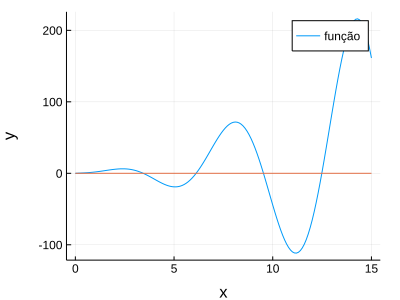

In [6]:
using Plots
gr()

plot(0:0.1:15, f, label = "função", size = (400, 300))
plot!(0:15, zero, label="", xlabel = "x", ylabel="y")

Criar o vetor de valores iniciais ($x_i$) e o dataframe "resultado 1" contendo dados aleatórios de tamanho definido:

In [11]:
# xi
x_i = [0.0, 2.0, 6.0, 9.0, 13.0]

# dataframe
Resultado1 = DataFrame(xi = x_i, raiz = rand(5))

,xi,raiz
1,0.0,0.534137
2,2.0,0.343322
3,6.0,0.317696
4,9.0,0.422612
5,13.0,0.354867


Laço `for` adiciona o valor da raiz calculada na coluna 2.

In [18]:
for i = 1:length(x_i)
    Resultado1.raiz[i] = nsolve(f(x), xi[i])
end

In [19]:
Resultado1

,xi,raiz
1,0.0,0.0
2,2.0,0.0
3,6.0,6.11902
4,9.0,9.5299
5,13.0,12.4862


**Outra forma "Like a Python"**

Criar um DataFrame vazio. 

In [20]:
Resultado2 = DataFrame(xi = Float64[], raiz = Float64[])

,xi,raiz


In [21]:
x_i = [0.0, 2.0, 6.0, 9.0, 13.0]

for i in x_i
    push!(Resultado2, [i, nsolve(f(x), i)])
end

unique!(Resultado2)

,xi,raiz
1,0.0,0.0
2,2.0,0.0
3,6.0,6.11902
4,9.0,9.5299
5,13.0,12.4862


In [22]:
# testando os resultados
[f(i) for i = Resultado2.raiz]

5-element Array{Float64,1}:
  0.0                  
  0.0                  
  8.881784197001252e-15
  4.085620730620576e-14
 -6.039613253960852e-14

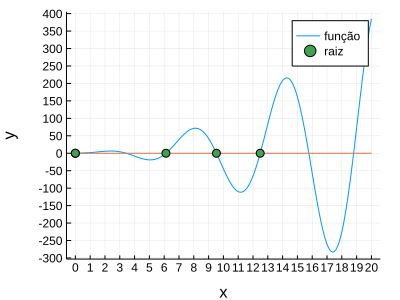

In [24]:
using Plots
gr()

plot(0:0.1:20, f, label = "função", size = (400, 300))
plot!(0:20, zero, label = "")
scatter!(Resultado2.raiz, zero, label = "raiz", 
    xaxis = ("x",  0:1:20), 
    yaxis = ("y", -500:50:500))

In [25]:
# Gravando os dados em um arquivo CSV
CSV.write("Resultado2.csv", Resultado2);

**Outa forma de adicionar dados ao final de um Dataframe**

Comando vcat. Sintaxe:

```julia
vcat(nome_Dataframe, DataFrame(coluna1 = dados, coluna2 = dados))
```
Ou
```julia
push!(nome_dataframe, [dado_col_1, dado_col_2]) 
```

**Adicionando um único valor de raiz**

In [26]:
Resultado2 = CSV.read("Resultado2.csv")

,xi,raiz
1,0.0,0.0
2,2.0,0.0
3,6.0,6.11902
4,9.0,9.5299
5,13.0,12.4862


In [27]:
vcat(Resultado2, DataFrame(xi = 60, raiz = float(nsolve(f(x), 60))))

,xi,raiz
1,0.0,0.0
2,2.0,0.0
3,6.0,6.11902
4,9.0,9.5299
5,13.0,12.4862
6,60.0,59.707


In [28]:
push!(Resultado2, [80, nsolve(f(x), 80)]) 

,xi,raiz
1,0.0,0.0
2,2.0,0.0
3,6.0,6.11902
4,9.0,9.5299
5,13.0,12.4862
6,80.0,-15.7714


**Adicionando vários valores de raizes**

In [29]:
# vetor de raízes aproximadas e vetor de raizes calculadas pelo SymPy
novos_xi = [62.0, 70.0, 75.0, 80.0] 

novas_raizes = float([nsolve(f(x), raiz) for raiz = novos_xi])

4-element Array{Float64,1}:
  62.81593287133609 
  69.10056621235024 
  75.38495805125963 
 -15.771411695083252

In [30]:
Resultado2 = vcat(Resultado2, DataFrame(xi = novos_xi, raiz = novas_raizes))

,xi,raiz
1,0.0,0.0
2,2.0,0.0
3,6.0,6.11902
4,9.0,9.5299
5,13.0,12.4862
6,80.0,-15.7714
7,62.0,62.8159
8,70.0,69.1006
9,75.0,75.385
10,80.0,-15.7714


## QUERY

Query é um pacote para consultar as fontes de dados. O pacote permite filtrar, projetar, unir e agrupar dados de qualquer fonte de dados iterável. Possui suporte aprimorado para consulta de arrays, DataFrames, TypedTables, IndexedTables e qualquer fonte DataStream (CSV, SQLite etc.).

In [31]:
using Pkg
Pkg.add("Query")
using Query, DataFrames

  Updating registry at `~/.julia/registries/General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`


┌ Warning: Some registries failed to update:
│     — /home/jmarcellopereira/.julia/registries/General — failed to fetch from repo
└ @ Pkg.API /buildworker/worker/package_linux64/build/usr/share/julia/stdlib/v1.0/Pkg/src/API.jl:144


 Resolving package versions...


Pkg.Types.ResolverError: Unsatisfiable requirements detected for package JLD [4138dd39]:
 JLD [4138dd39] log:
 ├─possible versions are: [0.5.0-0.5.9, 0.6.0-0.6.11, 0.8.0-0.8.3] or uninstalled
 ├─restricted to versions * by an explicit requirement, leaving only versions [0.5.0-0.5.9, 0.6.0-0.6.11, 0.8.0-0.8.3]
 └─restricted by julia compatibility requirements to versions: uninstalled — no versions left

In [32]:
# copiar Dataframe gravado em arquivo
Softwares1 = CSV.read("Softwares.csv")

,Nome_do_software,Ano_de_lancamento,Site
1,Julia,2012,julialang.org
2,SageMath,2005,sagemath.org
3,Maxima,1980,maxima.org
4,Octave,2000,gnu.org/octave
5,Maxima,1980,maxima.org


In [33]:
x = CSV.@from i in Softwares1 begin
    CSV.@where i.Ano_de_lancamento > 2000 
    CSV.@select {i.Nome_do_software, i.Ano_de_lancamento, i.Site}
    CSV.@collect DataFrame
end

LoadError: UndefVarError: @from not defined

In [92]:
x = @from i in Softwares1 begin
    @where i.Ano_de_lancamento > 2000 && i.Ano_de_lancamento < 2010
    @select {i.Nome_do_software, i.Ano_de_lancamento, i.Site}
    @collect DataFrame
end

LoadError: [91mUndefVarError: @from not defined[39m

In [13]:
Pkg.add("DataFramesMeta")

 Resolving package versions...


Pkg.Types.ResolverError: Unsatisfiable requirements detected for package JLD [4138dd39]:
 JLD [4138dd39] log:
 ├─possible versions are: [0.5.0-0.5.9, 0.6.0-0.6.11, 0.8.0-0.8.3] or uninstalled
 ├─restricted to versions * by an explicit requirement, leaving only versions [0.5.0-0.5.9, 0.6.0-0.6.11, 0.8.0-0.8.3]
 └─restricted by julia compatibility requirements to versions: uninstalled — no versions left

In [10]:
Pkg.add("DataFramesMeta")

UndefVarError: UndefVarError: Pkg not defined

In [94]:
using DataFrames 
using DataArrays
using DataFramesMeta

LoadError: [91mArgumentError: Module DataFramesMeta not found in current path.
Run `Pkg.add("DataFramesMeta")` to install the DataFramesMeta package.[39m

In [95]:
df = DataFrame(a = [1,2,3], b = [4,5,6])

,a,b
1,1,4
2,2,5
3,3,6


In [96]:
@where(df, :a .> 2)

LoadError: [91mUndefVarError: @where not defined[39m

In [97]:
@with(df, df[:a .> 1, ^(:b)])

LoadError: [91mUndefVarError: @with not defined[39m

In [98]:
@with(df, :a + _I_(:b) )

LoadError: [91mUndefVarError: @with not defined[39m

In [99]:
@where(df, :a .> 2)

LoadError: [91mUndefVarError: @where not defined[39m

## REFERENCIAS

JOSHI, A. . **Julia for Data Science**. 1. ed. Birmingham-UK: Packt Publishing Ltd, 2016, ISBN 978-1-78528-969-9  